# LOAD MRI FILES 

In [2]:
import os
import nibabel as nib
import numpy as np

# Path to the main data folder 
data_dir = "D:/FINAL PROJECT AUTISM/dataset/CaliforniaTech/Caltech"

# Collect all MRI file paths
mri_files = []
for subject_folder in sorted(os.listdir(data_dir)):  # Loop through each subject
    subject_path = os.path.join(data_dir, subject_folder, "session_1", "anat_1")
    for file in os.listdir(subject_path):
        if file.endswith(".nii.gz"):
            mri_files.append(os.path.join(subject_path, file))

print(f"Total MRI files found: {len(mri_files)}")  # Should be 38



Total MRI files found: 38


# LOAD AND STORE MRI IMAGES


In [9]:
import numpy as np

# Load all MRI images into a list
mri_data_list = []

for file_path in mri_files:
    mri_img = nib.load(file_path)  # Load MRI file
    mri_data = mri_img.get_fdata()  # Convert to NumPy array
    mri_data_list.append(mri_data)

print(f"Loaded {len(mri_data_list)} MRI scans.")

Loaded 38 MRI scans.


In [13]:
print(mri_data_list[1])

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]


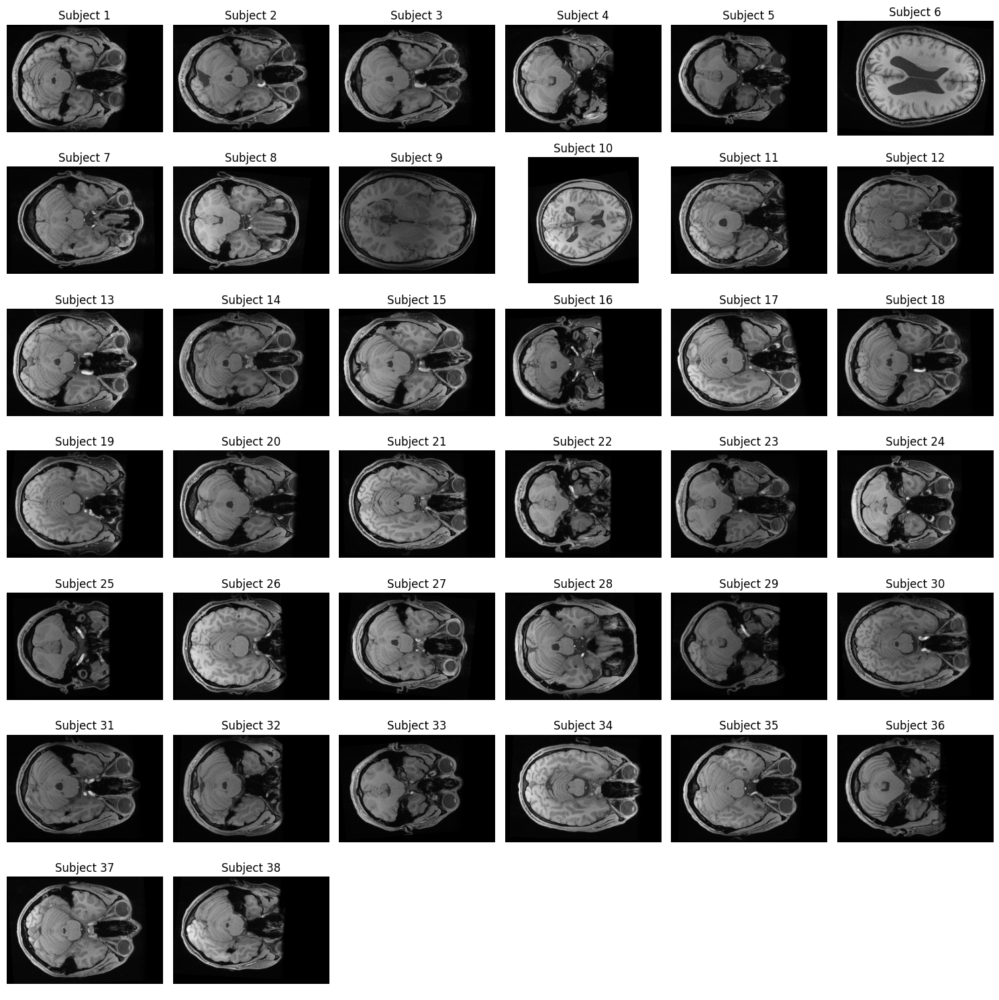

In [10]:
import matplotlib.pyplot as plt

# Plot settings
num_images = len(mri_data_list)
cols = 6  # Number of columns in the grid
rows = (num_images // cols) + 1  # Calculate rows required

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = mri_data_list[i]  # Get MRI image
        mid_slice = img.shape[2] // 2  # Extract middle slice along Z-axis
        ax.imshow(img[:, :, mid_slice], cmap="gray")  # Display axial slice
        ax.set_title(f"Subject {i+1}")
        ax.axis("off")
    else:
        ax.axis("off")  # Hide empty plots

plt.tight_layout()
plt.show()

# RESIZING THE MRI IMAGES 

In [17]:
from scipy.ndimage import zoom

# Target shape
target_shape = (128, 128, 128)

# Resize all MRI images
resized_mri_data = []

for file in mri_files:
    mri_img = nib.load(file)  # Load MRI image
    mri_data = mri_img.get_fdata()  # Convert to NumPy array
    
    # Compute scaling factors
    scale_factors = (target_shape[0] / mri_data.shape[0], 
                     target_shape[1] / mri_data.shape[1], 
                     target_shape[2] / mri_data.shape[2])
    
    # Resize the image
    resized_mri = zoom(mri_data, scale_factors, order=3)  # Cubic interpolation
    
    resized_mri_data.append(resized_mri)

print(f"Resized {len(resized_mri_data)} MRI images to {target_shape}. Shape of first image:", resized_mri_data[0].shape)

Resized 38 MRI images to (128, 128, 128). Shape of first image: (128, 128, 128)


# NORMALIZING THE MRI IMAGES

In [19]:
# Normalize MRI data
normalized_mri_data = []

for img in resized_mri_data:
    norm_data = (img - np.min(img)) / (np.max(img) - np.min(img))  # Min-Max Normalization
    normalized_mri_data.append(norm_data)

print(f"Normalization complete. Shape of first image: {normalized_mri_data[0].shape}")

Normalization complete. Shape of first image: (128, 128, 128)


In [20]:
print(normalized_mri_data)

[array([[[0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572594,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572599,
         0.07572595, 0.07572595],
        ...,
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595]],

       [[0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572593,
         0.07572595, 0.07572595],
        [0.07572595, 0.07572595, 0.07572595, ..., 0.075726  ,
         0.07572595, 0.07572595],
        ...,
        [0.07572595, 0.07572595, 0.07572595, ..., 0.07572595,
         0.07572595, 0.07572595],
        [0.

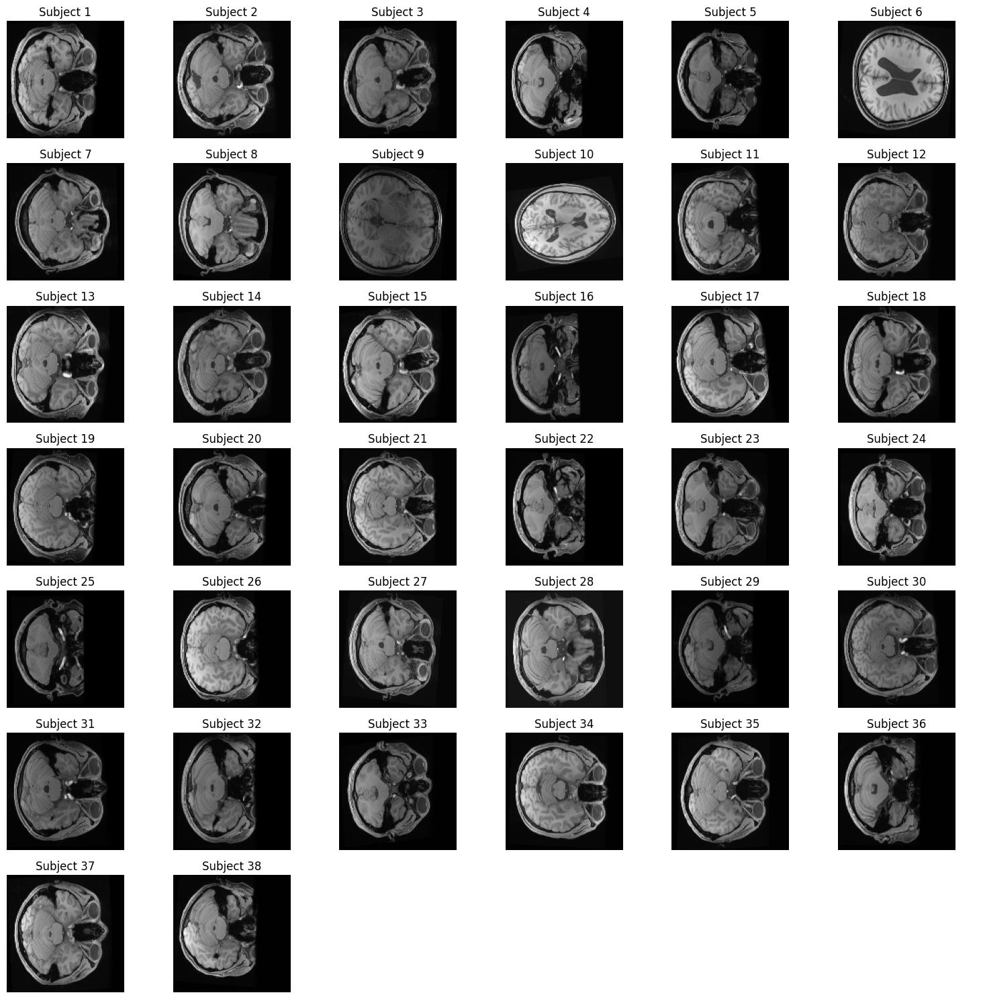

In [21]:
import matplotlib.pyplot as plt

# Set the number of rows and columns for displaying images
num_images = len(normalized_mri_data)  # Should be 38
cols = 6  # Number of columns
rows = (num_images // cols) + 1  # Calculate required rows

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = normalized_mri_data[i]
        
        # Select the middle slice along the z-axis for visualization
        mid_slice = img.shape[2] // 2
        ax.imshow(img[:, :, mid_slice], cmap="gray")

        ax.set_title(f"Subject {i+1}")
        ax.axis("off")  # Hide axes for better visualization
    else:
        ax.axis("off")  # Hide extra subplots

plt.tight_layout()
plt.show()

# COMPARING ORIGINAL VS NORMALIZED VALUES 

In [22]:
for i in range(len(normalized_mri_data)):
    print(f"Subject {i+1}:")
    print(f"  Original Min: {np.min(mri_data_list[i])}, Max: {np.max(mri_data_list[i])}")
    print(f"  Normalized Min: {np.min(normalized_mri_data[i])}, Max: {np.max(normalized_mri_data[i])}\n")

Subject 1:
  Original Min: -3.0, Max: 1033.0
  Normalized Min: 0.0, Max: 1.0

Subject 2:
  Original Min: -6.0, Max: 1373.0
  Normalized Min: 0.0, Max: 1.0

Subject 3:
  Original Min: -2.0, Max: 1071.0
  Normalized Min: 0.0, Max: 1.0

Subject 4:
  Original Min: -4.0, Max: 1172.0
  Normalized Min: 0.0, Max: 1.0

Subject 5:
  Original Min: -10.0, Max: 930.0
  Normalized Min: 0.0, Max: 1.0

Subject 6:
  Original Min: -4.0, Max: 1384.0
  Normalized Min: 0.0, Max: 1.0

Subject 7:
  Original Min: -7.0, Max: 1009.0
  Normalized Min: 0.0, Max: 1.0

Subject 8:
  Original Min: -8.0, Max: 978.0
  Normalized Min: 0.0, Max: 1.0

Subject 9:
  Original Min: 0.0, Max: 1744.0
  Normalized Min: 0.0, Max: 1.0

Subject 10:
  Original Min: -4.0, Max: 1197.0
  Normalized Min: 0.0, Max: 1.0

Subject 11:
  Original Min: -7.0, Max: 1007.0
  Normalized Min: 0.0, Max: 1.0

Subject 12:
  Original Min: -2.0, Max: 986.0
  Normalized Min: 0.0, Max: 1.0

Subject 13:
  Original Min: -2.0, Max: 1172.0
  Normalized Min: 

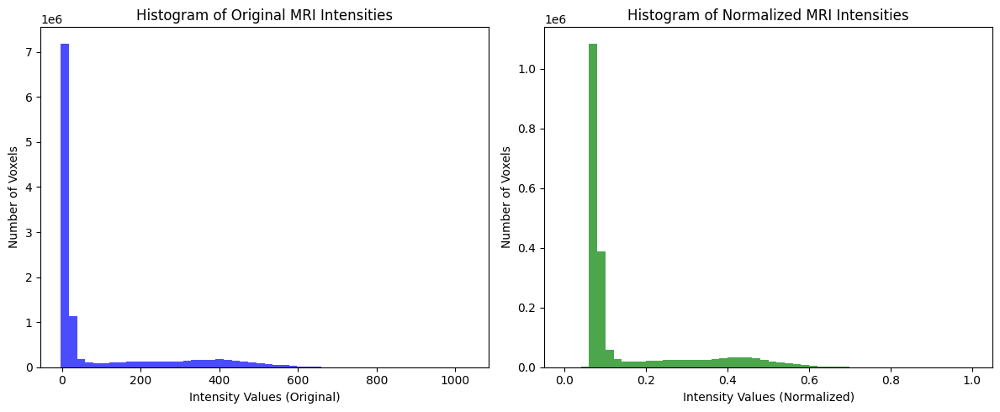

In [23]:
import matplotlib.pyplot as plt

# Select an image to visualize
index = 0  # Change this index to view different images
original_data = mri_data_list[index].flatten()  # Flatten for histogram
normalized_data = normalized_mri_data[index].flatten()

# Plot original MRI intensity distribution
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(original_data, bins=50, color='blue', alpha=0.7)
plt.xlabel("Intensity Values (Original)")
plt.ylabel("Number of Voxels")
plt.title("Histogram of Original MRI Intensities")

# Plot normalized MRI intensity distribution
plt.subplot(1, 2, 2)
plt.hist(normalized_data, bins=50, color='green', alpha=0.7)
plt.xlabel("Intensity Values (Normalized)")
plt.ylabel("Number of Voxels")
plt.title("Histogram of Normalized MRI Intensities")

plt.tight_layout()
plt.show()

# CLAHE 

In [32]:
import cv2
import numpy as np

# Apply CLAHE to each 2D slice along the depth axis
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

clahe_mri_data = []
for img in normalized_mri_data:  # Loop through each MRI scan
    enhanced_slices = []
    for i in range(img.shape[2]):  # Iterate over slices along the z-axis
        slice_2d = img[:, :, i]  # Extract a 2D slice
        slice_2d = (slice_2d * 255).astype(np.uint8)  # Convert to uint8 for CLAHE
        clahe_slice = clahe.apply(slice_2d)  # Apply CLAHE
        enhanced_slices.append(clahe_slice)
    
    enhanced_img = np.stack(enhanced_slices, axis=2)  # Reconstruct 3D image
    clahe_mri_data.append(enhanced_img)

print("CLAHE enhancement applied to all slices.")

CLAHE enhancement applied to all slices.


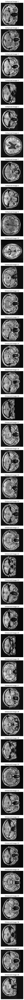

In [34]:
import matplotlib.pyplot as plt

# Display all enhanced images (showing the middle slice of each for visualization)
fig, axes = plt.subplots(len(clahe_mri_data), 1, figsize=(5, len(clahe_mri_data) * 3))

for i, img in enumerate(clahe_mri_data):
    mid_slice = img.shape[2] // 2  # Get the middle slice
    axes[i].imshow(img[:, :, mid_slice], cmap="gray")  # Show the middle slice
    axes[i].axis("off")
    axes[i].set_title(f"Enhanced Image {i+1}")

plt.tight_layout()
plt.show()

# COMPARISON BETWEEN NORMALIZED VS ENHANCED

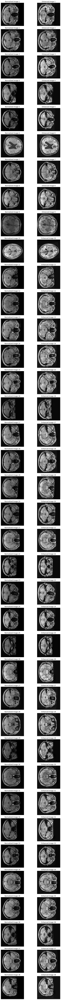

In [35]:
import matplotlib.pyplot as plt

# Display side-by-side comparison of normalized vs enhanced images
fig, axes = plt.subplots(len(clahe_mri_data), 2, figsize=(10, len(clahe_mri_data) * 3))

for i, (norm_img, enh_img) in enumerate(zip(normalized_mri_data, clahe_mri_data)):
    mid_slice = norm_img.shape[2] // 2  # Middle slice index

    # Normalized Image
    axes[i, 0].imshow(norm_img[:, :, mid_slice], cmap="gray")
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"Normalized Image {i+1}")

    # Enhanced Image
    axes[i, 1].imshow(enh_img[:, :, mid_slice], cmap="gray")
    axes[i, 1].axis("off")
    axes[i, 1].set_title(f"Enhanced Image {i+1}")

plt.tight_layout()
plt.show()

# LABELLING OF THE DATASET

In [41]:
import numpy as np

# Assign labels based on index
labels = []
for idx in range(len(clahe_mri_data)):
    if idx < 19:
        labels.append(0)  # Patients 1-19 are ASD
    else:
        labels.append(1)   # Patients 20-28 are TC

print("Labels assigned successfully.")

Labels assigned successfully.


In [42]:
print(labels)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


# TEST TRAIN SPLIT

In [43]:
from sklearn.model_selection import train_test_split

# Convert data and labels to numpy arrays
clahe_mri_data = np.array(clahe_mri_data)
labels = np.array(labels)

# Split into train (75%) and test (25%) sets
X_train, X_test, y_train, y_test = train_test_split(clahe_mri_data, labels, test_size=0.25, random_state=42, stratify=labels)

print("Training set size:", X_train.shape[0])
print("Testing set size:", X_test.shape[0])

Training set size: 28
Testing set size: 10


In [50]:
from collections import Counter

# Count occurrences of each label in train and test sets
train_label_counts = Counter(y_train)
test_label_counts = Counter(y_test)

print("Training set label distribution:", train_label_counts)
print("Testing set label distribution:", test_label_counts)

Training set label distribution: Counter({1: 14, 0: 14})
Testing set label distribution: Counter({0: 5, 1: 5})


# AUGMENTATION OF THE TRAINING SET

In [51]:
import numpy as np
import scipy.ndimage

# Function to apply augmentation (rotation and flipping)
def augment_image(image):
    augmented_images = []

    # Original image
    augmented_images.append(image)

    # Rotation (random angles)
    for angle in [15, -15, 30, -30]:  
        rotated = scipy.ndimage.rotate(image, angle, axes=(0, 1), reshape=False, mode='nearest')
        augmented_images.append(rotated)

    # Flipping
    flipped_lr = np.flip(image, axis=1)  # Left-Right flip
    flipped_ud = np.flip(image, axis=2)  # Up-Down flip
    augmented_images.extend([flipped_lr, flipped_ud])

    return augmented_images

# Apply augmentation to training set
augmented_train_images = []
augmented_train_labels = []

for img, label in zip(X_train, y_train):
    augmented_images = augment_image(img)
    augmented_train_images.extend(augmented_images)
    augmented_train_labels.extend([label] * len(augmented_images))  # Keep labels consistent

print(f"Original training set size: {len(X_train)}")
print(f"Augmented training set size: {len(augmented_train_images)}")

Original training set size: 28
Augmented training set size: 196


In [56]:
import numpy as np
from collections import Counter

# Use y_train instead of train_labels
unique, counts = np.unique(y_train, return_counts=True)
label_distribution_before = dict(zip(unique, counts))

# Count labels after augmentation
augmented_labels = np.repeat(y_train, 6)  # Repeat each label 6 times

unique_aug, counts_aug = np.unique(augmented_labels, return_counts=True)
label_distribution_after = dict(zip(unique_aug, counts_aug))

print("Label distribution before augmentation:", label_distribution_before)
print("Label distribution after augmentation:", label_distribution_after)


Label distribution before augmentation: {0: 14, 1: 14}
Label distribution after augmentation: {0: 84, 1: 84}


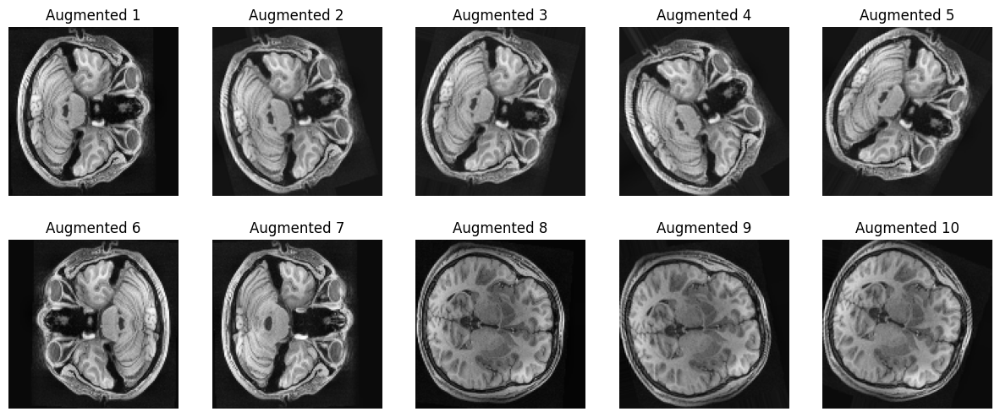

In [38]:
import matplotlib.pyplot as plt

# Function to display images
def plot_augmented_images(images, num_images=10):
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.imshow(images[i][..., images[i].shape[-1] // 2], cmap='gray')  # Middle slice of the 3D image
            ax.axis("off")
            ax.set_title(f"Augmented {i+1}")

    plt.show()

# Display the first 10 augmented images
plot_augmented_images(augmented_train_images, num_images=10)